##Import

In [ ]:
! pip install lime
from lime import lime_text
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
from wordcloud import WordCloud

import pandas as pd
import numpy as np
from glob import glob
import re
import json
import csv
import os

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,f1_score, confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import VotingClassifier

from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

import matplotlib.pyplot as plt

from google.colab import drive

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
english_stopwords = stopwords.words("english") #From ICHCL Baseline from Hasoc
with open('/content/drive/MyDrive/ICON/final_stopwords.txt', encoding = 'utf-8') as f:
    hindi_stopwords = f.readlines()
    for i in range(len(hindi_stopwords)):
        hindi_stopwords[i] = re.sub('\n','',hindi_stopwords[i])
stopwords = english_stopwords + hindi_stopwords
english_stemmer = SnowballStemmer("english")

In [ ]:
words_dict  = { "तैराक":"तैर",
                "चालाक":"चाल",
                "कूलाक":"कूल",
                "बेलन":"बेल",
                "मिलाप":"मिल",
                "चुपचाप": "चुप",
                "निकास":"निकस",
                "लुकास":"लुक",
                }

In [ ]:
suffixes = {
	    1: ["ो", "े", "ू", "ु", "ी", "ि", "ा"],  
            2: ["तृ","ान","ैत","ने","ाऊ","ाव","कर", "ाओ", "िए", "ाई", "ाए", "नी", "ना", "ते", "ीं", "ती",
                "ता", "ाँ", "ां", "ों", "ें","ीय", "ति","या", "पन", "पा","ित","ीन","लु","यत","वट","लू"],     
            3: ["ेरा","त्व","नीय","ौनी","ौवल","ौती","ौता","ापा","वास","हास","काल","पान","न्त","ौना","सार","पोश","नाक",
                "ियल","ैया", "ौटी","ावा","ाहट","िया","हार", "ाकर", "ाइए", "ाईं", "ाया", "ेगी", "वान", "बीन",
                "ेगा", "ोगी", "ोगे", "ाने", "ाना", "ाते", "ाती", "ाता", "तीं", "ाओं", "ाएं", "ुओं", "ुएं", "ुआं","कला","िमा","कार",
                "गार", "दान","खोर"],     
            4: ["ावास","कलाप","हारा","तव्य","वैया", "वाला", "ाएगी", "ाएगा", "ाओगी", "ाओगे", 
                "एंगी", "ेंगी", "एंगे", "ेंगे", "ूंगी", "ूंगा", "ातीं", "नाओं", "नाएं", "ताओं", "ताएं", "ियाँ", "ियों", "ियां",
                "त्वा","तव्य","कल्प","िष्ठ","जादा","क्कड़"],     
            5: ["ाएंगी", "ाएंगे", "ाऊंगी", "ाऊंगा", "ाइयाँ", "ाइयों", "ाइयां", "अक्कड़","तव्य:","निष्ठ"],
}

special_suffixes = ["र्", "ज्य","त्य"]
dict_special_suffixes = {"र्":"ृ",
                         "ज्य":"ज्",
                         "त्य":"त्"}

In [ ]:
def hi_stem(word, clean=False,chars=None):
    if clean == True:
        word = clean_text(word, chars)
    
    ans = word
    bl = False
    
    if word in words_dict.keys():
        return words_dict[word]
    
    for L in 5, 4, 3, 2, 1:
        if len(word) > L + 1:
            for suf in suffixes[L]:
                if word.endswith(suf):
                    ans = word[:-L]
                    bl =True
        if bl == True:
            break
                    
    if bl == True:
        for suf in suffixes[1]:
            if ans.endswith(suf):
                # use case - गानेवाला
                ans = hi_stem(ans)
   
    for suf in special_suffixes:
        if ans.endswith(suf):
            l = len(suf)
            ans = ans[:-l]
            ans += dict_special_suffixes[suf]
 
    return ans

In [ ]:
def clean_text(text, chars=None):
    if chars == None:        
        text = re.sub(r"[()\"#/@;:<>{}`+=~|!?,']", "", text)
    else:
        text = re.sub(r"[" +chars+ "()\"#/@;:<>{}`+=~|!?,']", "", text)
    return text

## Read Data

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/ICON/Training Data/train_hin.tsv', delimiter='\t')

In [ ]:
data.shape

(4615, 3)

In [ ]:
dev_data = pd.read_csv('/content/drive/MyDrive/ICON/Training Data/dev_hin.tsv', delimiter='\t')

In [ ]:
dev_data.shape

(1000, 3)

In [ ]:
data = pd.concat([data,dev_data])

In [ ]:
data.shape

(5615, 3)

In [ ]:
gold_data =  pd.read_csv('/content/drive/MyDrive/ICON/commaaticon_gold_data/gold_hin.tsv', delimiter='\t')

In [ ]:
gold_data.head()

,ID,Labels
0,T.1.470,"(OAG,NGEN,NCOM)"
1,T.1.847,"(OAG,NGEN,COM)"
2,T.1.1458,"(OAG,NGEN,COM)"
3,T.1.398,"(OAG,NGEN,NCOM)"
4,T.1.1043,"(OAG,NGEN,COM)"


In [ ]:
test_data = pd.read_csv('/content/drive/MyDrive/ICON/test_hin.tsv', delimiter='\t')

In [ ]:
labels = gold_data["Labels"]
labels
test_data = test_data.join(labels)

In [ ]:
test_data.shape

(1002, 3)

In [ ]:
test_data.head()

,ID,Text,Labels
0,T.1.470,Ayesha ko leke ad banane ka koi himmat nahi ha...,"(OAG,NGEN,NCOM)"
1,T.1.847,भारत में इस्लाम का किसी भी रूप में होना अशुभ ह...,"(OAG,NGEN,COM)"
2,T.1.1458,Islam ke naam par dhabba ho,"(OAG,NGEN,COM)"
3,T.1.398,Pagal doge ne kaat liya?,"(OAG,NGEN,NCOM)"
4,T.1.1043,वैसे गद्दार हिंदुओं का बहिष्कार करें जो मुस्लि...,"(OAG,NGEN,COM)"


In [ ]:
dev_data.head()

,ID,Text,Labels
0,1245736905884352512,चाइना मे चमकादड की वजह से और भारत में दाढ़ी वा...,"(OAG,NGEN,COM)"
1,C8.2864,nikl lawdi phli fursat me nikal.... lehen ki b...,"(OAG,GEN,NCOM)"
2,C577.190,Aur aapke kapde bhi kam nahi pura hero wala st...,"(CAG,NGEN,NCOM)"
3,C8.16820.2,@samantaaa but who in the holy hell says to re...,"(CAG,GEN,NCOM)"
4,1245871883859439623,Here’s another masterpiece which has been adde...,"(NAG,NGEN,NCOM)"


In [ ]:
data.shape

(5615, 3)

In [ ]:
data['Labels'].value_counts()

(NAG,NGEN,NCOM)    1380
(OAG,NGEN,NCOM)    1290
(OAG,NGEN,COM)      896
(OAG,GEN,NCOM)      790
(CAG,NGEN,NCOM)     648
(CAG,NGEN,COM)      177
(NAG,GEN,NCOM)      156
(CAG,GEN,NCOM)      138
(OAG,GEN,COM)        76
(NAG,NGEN,COM)       49
(NAG,GEN,COM)         9
(CAG,GEN,COM)         6
Name: Labels, dtype: int64

##Preprocessing

In [ ]:
regex_for_english_hindi_emojis="[^a-zA-Z#\U0001F300-\U0001F5FF'|'\U0001F600-\U0001F64F'|'\U0001F680-\U0001F6FF'|'\u2600-\u26FF\u2700-\u27BF\u0900-\u097F]"
def clean_text(text):
    text = re.sub(r"@[A-Za-z0-9]+",' ', str(text))
    text = re.sub(r"https?://[A-Za-z0-9./]+",' ', text)
    text = re.sub(regex_for_english_hindi_emojis,' ', text)
    text = re.sub("RT ", " ", text)
    text = re.sub("\n", " ", text)
    text = re.sub(r" +", " ", text)
    tokens = []
    for token in text.split():
        if token not in stopwords:
            token = english_stemmer.stem(token)
            token = hi_stem(token)
            tokens.append(token)
    return " ".join(tokens)

def convert_gen(text):
    label = text[1:-1].split(",")
    text = label[1]
    if text == "GEN":
      return 1
    return 0

def convert_com(text):
    label = text[1:-1].split(",")
    text = label[2]
    if text == "COM":
      return 1
    return 0

def convert_agg(text):
    label = text[1:-1].split(",")
    text = label[0]
    if text == "OAG":
      return 2
    if text == "CAG":
      return 1
    return 0

In [ ]:
cleaned_text = [clean_text(text) for text in data.Text]
test_cleaned_text = [clean_text(text) for text in test_data.Text]

In [ ]:
#cleaned_text

In [ ]:
vectorizer = TfidfVectorizer(min_df = 3)
X = vectorizer.fit_transform(cleaned_text)

In [ ]:
X_test = vectorizer.transform(test_cleaned_text)

In [ ]:
# X = X.todense()
# X_test = X_test.todense()

In [ ]:
y_agg = data.Labels.apply(lambda x: convert_agg(x))
y_test_agg = test_data.Labels.apply(lambda x: convert_agg(x))
#NAG - 0; CAG - 1; OAG - 2

In [ ]:
y_gen = data.Labels.apply(lambda x: convert_gen(x))
y_test_gen = test_data.Labels.apply(lambda x: convert_gen(x))
#NGEN - 0; GEN - 1

In [ ]:
y_com = data.Labels.apply(lambda x: convert_com(x))
y_test_com = test_data.Labels.apply(lambda x: convert_com(x))
#NCOM - 0; COM - 1

In [ ]:
image = vectorizer.vocabulary_
Cloud = WordCloud(background_color="white", max_words=100).generate_from_frequencies(image)

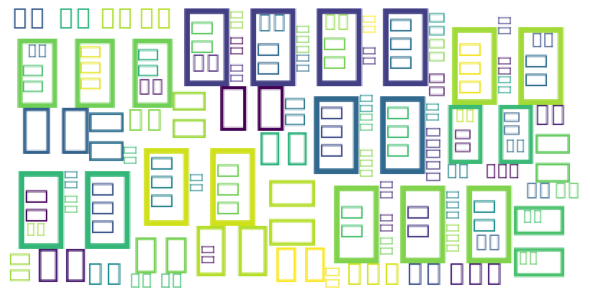

In [ ]:
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(Cloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [ ]:
print(vectorizer.vocabulary_)

{'modi': 2288, 'kiya': 1909, 'bat': 377, 'hai': 1324, 'ye': 3597, 'sach': 2887, 'veri': 3463, 'nice': 2419, 'new': 2412, 'गल': 3781, 'कह': 3760, 'उनक': 3709, 'शन': 4042, 'नह': 3886, 'बनव': 3927, 'muslimvirus': 2349, 'islamiccoronajehad': 1569, 'चल': 3794, 'अच': 3634, 'आएग': 3657, 'khate': 1857, 'hain': 1326, 'fir': 1176, 'bjp': 520, 'govern': 1293, 'jai': 1616, 'hind': 1401, 'what': 3533, 'number': 2462, 'qualifi': 2705, 'term': 3257, 'bantabligijamat': 359, 'are': 198, 'bc': 389, 'bina': 512, 'sourc': 3114, 'ke': 1829, 'kuch': 1941, 'bhi': 477, 'ja': 1596, 'rhi': 2837, 'lol': 2100, 'iss': 1583, 'zyada': 3630, 'fake': 1128, 'news': 2413, 'nhi': 2417, 'dekhi': 908, 'aaj': 6, 'tak': 3222, 'where': 3538, 'dal': 855, 'member': 2239, 'as': 217, 'home': 1427, 'abl': 45, 'tackl': 3219, 'seek': 2989, 'help': 1389, 'easili': 1053, 'make': 2150, 'fall': 1129, 'line': 2073, 'sir': 3072, 'shoot': 3039, 'cooper': 788, 'khud': 1869, 'desh': 937, 'ko': 1915, 'nizamuddinidiot': 2434, 'chinavirus': 688

## Ensemble Model

###Gender Bias

In [ ]:
lr_gen = LogisticRegression(max_iter=2000)
rf_gen = RandomForestClassifier(n_estimators=5000)
svm_gen = SVC(kernel='rbf',probability=True)

In [ ]:
X_train = X
y_train = y_gen

In [ ]:
# X_train, X_val, y_train, y_val = train_test_split(X, y_gen, test_size=0.2, random_state=42)

In [ ]:
eclf1_gen = VotingClassifier(estimators=[
         ('lr', lr_gen), ('rf', rf_gen), ('svm',svm_gen)], voting='soft', weights=[2,1,1],
        flatten_transform=True)
eclf1_gen.fit(X_train, y_train)

ens_pred1_gen = eclf1_gen.predict(X_test)

In [ ]:
print("Accuracy of the model : ", accuracy_score(ens_pred1_gen, y_test_gen))
print('F1-score: ', f1_score(ens_pred1_gen, y_test_gen))
print('Confusion matrix:')
confusion_matrix(y_test_gen,ens_pred1_gen)

Accuracy of the model :  0.782435129740519
F1-score:  0.16793893129770993
Confusion matrix:


array([[762,  36],
       [182,  22]])

In [ ]:
print(classification_report(y_test_gen, ens_pred1_gen))

              precision    recall  f1-score   support

           0       0.81      0.95      0.87       798
           1       0.38      0.11      0.17       204

    accuracy                           0.78      1002
   macro avg       0.59      0.53      0.52      1002
weighted avg       0.72      0.78      0.73      1002



Lime Explainer


In [ ]:
ens_pipeline = make_pipeline(vectorizer, eclf1_gen)
ens_explainer = LimeTextExplainer(class_names=[0,1])

In [ ]:
idx = 21
exp = ens_explainer.explain_instance(test_cleaned_text[idx], ens_pipeline.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

True class: aur ye bumbedkar waal bhi bahut madarchod hai


In [ ]:
idx = 32
exp = ens_explainer.explain_instance(test_cleaned_text[idx], ens_pipeline.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

True class: or mt pdao ldkiyo ko chutiya sale


In [ ]:
test_cleaned_text[idx]

'or mt pdao ldkiyo ko chutiya sale'

In [ ]:
idx = 46
exp = ens_explainer.explain_instance(test_cleaned_text[idx], ens_pipeline.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

True class: girl epual boy


In [ ]:
idx = 503
exp = ens_explainer.explain_instance(test_cleaned_text[idx], ens_pipeline.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

True class: i understand bodi understand problem usn us bakt kya mahsoo kya har bakt bo dar ki kkhi afavaa se unki nokri n chali jay jisk liy unhon itni mahent ki pura comment section unki beauti ki tarif kar rha kuchh pata ni kya batana chhate hai lekin koi yh nhi bol rha ki unk sath galat hua nobodi talk courag


In [ ]:
idx = 69
exp = ens_explainer.explain_instance(test_cleaned_text[idx], ens_pipeline.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

True class: aligarh maulvi unnatur sex student maszid media silent bakri pel diya bc


In [ ]:
idx = 101
exp = ens_explainer.explain_instance(test_cleaned_text[idx], ens_pipeline.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

True class: today muslim girl sit bike hindu bangalorewhen got stop men told marri husband phone start shout back men got good respons return even marri muslim girl roam non muslim #bhagwalovetrap


In [ ]:
idx = 101
exp = ens_explainer.explain_instance(test_cleaned_text[idx], ens_pipeline.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

True class: today muslim girl sit bike hindu bangalorewhen got stop men told marri husband phone start shout back men got good respons return even marri muslim girl roam non muslim #bhagwalovetrap


### Communal Bias

In [ ]:
X_train = X
y_train = y_com
# X_train, X_val, y_train, y_val = train_test_split(X, y_com, test_size=0.2, random_state=42)

In [ ]:
rf_com = RandomForestClassifier(n_estimators=2000)
rf_com.fit(X_train, y_train)
ens_pred1_com = rf_com.predict(X_test)

In [ ]:
print("Accuracy of the model : ", accuracy_score(ens_pred1_com, y_test_com))
print('F1-score: ', f1_score(ens_pred1_com, y_test_com))
print('Confusion matrix:')
confusion_matrix(y_test_com,ens_pred1_com)

In [ ]:
print(classification_report(y_test_com, ens_pred1_com))

Lime Explainer

In [ ]:
ens_pipeline_comm = make_pipeline(vectorizer, rf_com)
ens_explainer_comm = LimeTextExplainer(class_names=[0,1])

In [ ]:
idx = 6
exp = ens_explainer_comm.explain_instance(test_cleaned_text[idx], ens_pipeline_comm.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 22
exp = ens_explainer_comm.explain_instance(test_cleaned_text[idx], ens_pipeline_comm.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 2
exp = ens_explainer_comm.explain_instance(test_cleaned_text[idx], ens_pipeline_comm.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 3
exp = ens_explainer_comm.explain_instance(test_cleaned_text[idx], ens_pipeline_comm.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 4
exp = ens_explainer_comm.explain_instance(test_cleaned_text[idx], ens_pipeline_comm.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 5
exp = ens_explainer_comm.explain_instance(test_cleaned_text[idx], ens_pipeline_comm.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

### Aggressiveness

In [ ]:
X_train = X
y_train = y_agg
y_test = y_test_agg

In [ ]:
eclf1_agg = VotingClassifier(estimators=[
         ('lr', lr_gen), ('rf', rf_gen), ('svm',svm_gen)], voting='soft', weights=[2,1,1],
        flatten_transform=True,verbose=True)
eclf1_agg.fit(X, y_train)

ens_pred1_agg = eclf1_agg.predict(X_test)

In [ ]:
print("Accuracy of the model : ", accuracy_score(ens_pred1_agg, y_test_agg))
print('Confusion matrix:')
confusion_matrix(y_test_agg,ens_pred1_agg)

In [ ]:
print(classification_report(y_test_agg, ens_pred1_agg))

Explainer

In [ ]:
ens_pipeline_agg = make_pipeline(vectorizer, eclf1_agg)
ens_explainer_agg = LimeTextExplainer(class_names=[0,1,2])

In [ ]:
idx = 6
exp = ens_explainer_agg.explain_instance(test_cleaned_text[idx], ens_pipeline_agg.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 1
exp = ens_explainer_agg.explain_instance(test_cleaned_text[idx], ens_pipeline_agg.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 2
exp = ens_explainer_agg.explain_instance(test_cleaned_text[idx], ens_pipeline_agg.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 3
exp = ens_explainer_agg.explain_instance(test_cleaned_text[idx], ens_pipeline_agg.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 4
exp = ens_explainer_agg.explain_instance(test_cleaned_text[idx], ens_pipeline_agg.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

In [ ]:
idx = 5
exp = ens_explainer_agg.explain_instance(test_cleaned_text[idx], ens_pipeline_agg.predict_proba, num_features=8)
print('True class: %s' % test_cleaned_text[idx])
exp.show_in_notebook(text=True)

##Submission

In [ ]:
def write_preds(input, preds, fname, delim='\t'):
    with open (fname, 'w') as f_w:
        writer = csv.writer(f_w, delimiter=delim)
        writer.writerow(['ID', 'Labels'])
        for id, label in zip(input, preds):
            writer.writerow([id, label])

In [ ]:
isSaveLR = True

In [ ]:
submission = []
a = [0 for i in ens_pred1_gen]
b = [0 for i in ens_pred1_gen]
c = [0 for i in ens_pred1_gen]
for i in range(len(ens_pred1_gen)):
  if ens_pred1_agg[i] == 0:
    a[i] = "NAG"
  elif ens_pred1_agg[i] == 1:
    a[i] = "CAG"
  else:
    a[i] = "OAG"

  if ens_pred1_gen[i] == 0:
    b[i] = "NGEN"
  else:
    b[i] = "GEN"

  if ens_pred1_com[i] == 0:
    c[i] = "NCOM"
  else:
    c[i] = "COM"

  string = str((a[i],b[i],c[i]))
  newString = ""
  for j in string:
    if j == "'" or j == ' ':
      continue
    else:
      newString += j
  submission.append(newString)

In [ ]:
submission

In [ ]:
 ids = list(test_data['ID'])

In [ ]:
if not os.path.exists('ens_submission1'):
  os.makedirs('ens_submission1')
if isSaveLR:
  write_preds(ids,submission,'ens_submission1/pred_hin.tsv')